# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor,  Resize, Normalize
from torch.nn import Module, Conv2d
from torch.nn import BatchNorm2d, LeakyReLU, Flatten, Linear, Dropout, ConvTranspose2d, ReLU, Tanh, BCEWithLogitsLoss

import os
import tests

In [2]:
# Check if CUDA is available
cuda_available = torch.cuda.is_available()

# Choose the device
device = torch.device("cuda:0" if cuda_available else "cpu")

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    transforms = [Resize(size),
                  ToTensor(),
                  Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        
        # list of images IMG
        self.images = self.__getfiles__()

    def __getfiles__(self) -> list:
        jpg_files = []
        files = os.listdir(self.directory)
        for file in files:
            if file.lower().endswith(self.extension):
                file_path = os.path.join(self.directory, file)
                image = Image.open(file_path)
                jpg_files.append(image)
        return jpg_files
            
    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        return self.images.__len__()

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        image = self.images[index]
        return self.transforms(image)

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

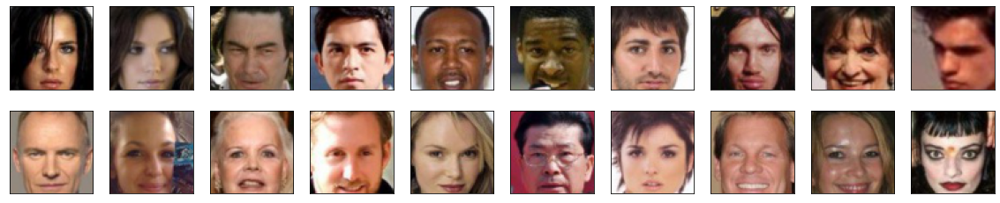

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
from torch.nn import Module

In [9]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: 
        Conv -> BatchNorm -> Activation
    Args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch_norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = BatchNorm2d(out_channels)
        self.activation = LeakyReLU(0.3)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [10]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        
        conv_dim = 64
        self.conv1 = ConvBlock(3, out_channels=conv_dim, kernel_size=4, batch_norm=False)
        self.conv2 = ConvBlock(in_channels=conv_dim, out_channels=conv_dim*2, kernel_size=4)
        self.conv3 = ConvBlock(in_channels=conv_dim*2, out_channels=conv_dim*4, kernel_size=4)
        self.conv4 = ConvBlock(in_channels=conv_dim*4, out_channels=conv_dim*8, kernel_size=4)
        
        self.flatten = Flatten()
        
        # Final, fully-connected layer
        self.fc = Linear(conv_dim*4*4*4*2, 1)
        # Add model regularization, i.e. dropout layer
        self.dropout = Dropout(0.3)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        # Apply horizontal flipping with a 50% probability during training
        if self.training and torch.rand(1) < 0.5:
            x = torch.flip(x, dims=[3])  # Flip along the width dimension
            
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        
        # flatten and dropout
        x = self.flatten(x)
        x = self.dropout(x)
        
        # final output layer
        x = self.fc(x)
        return x.view(1, 1, 1, -1)

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [12]:
class DeconvBlock(Module):
    """
    A de-convolutional block that is made of ConvTranspose, BatchNorm, Activation
        
    args:
    - in-channels: number of channels in the input to the conv layer
    - out-channels: number of filters in the input to the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self,
                in_channels: int,
                out_channels: int,
                kernel_size: int,
                stride: int,
                padding: int,
                batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        
        if self.batch_norm:
            self.bn = BatchNorm2d(out_channels)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        return x

In [13]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()

        conv_dim = 64
        # transpose the conv layers
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*8, kernel_size=4, stride=1, padding=0)
        self.deconv2 = DeconvBlock(conv_dim*8, conv_dim*4, kernel_size=4, stride=2, padding=1)
        self.deconv3 = DeconvBlock(conv_dim*4, conv_dim*2, kernel_size=4, stride=2, padding=1)
        self.deconv4 = DeconvBlock(conv_dim*2, conv_dim, kernel_size=4, stride=2, padding=1)
        self.deconv5 = DeconvBlock(conv_dim, 3, kernel_size=4, stride=2, padding=1, batch_norm=False)
        
        self.relu = ReLU()
        self.tanh = Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.relu(self.deconv1(x))
        x = self.relu(self.deconv2(x))
        x = self.relu(self.deconv3(x))
        x = self.relu(self.deconv4(x))
        x = self.tanh(self.deconv5(x))
        return x

In [14]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [15]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """

    g_optimizer = optim.Adam(generator.parameters(), lr=2e-3, betas=(0.5, 0.5))
    d_optimizer = optim.Adam(discriminator.parameters(), lr=2e-3, betas=(0.5, 0.5))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [16]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    labels = torch.ones_like(fake_logits).cuda()
    
    criterion = BCEWithLogitsLoss()
    loss = criterion(fake_logits, labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [17]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    real_labels = torch.ones_like(real_logits).cuda()  
    fake_labels = torch.zeros_like(fake_logits).cuda() 
    
    criterion = BCEWithLogitsLoss()
    
    r_loss = criterion(real_logits, real_labels)
    f_loss = criterion(fake_logits, fake_labels)
    
    loss = r_loss + f_loss
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [18]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [19]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    g_optimizer.zero_grad()
    
    # Generate random latent vectors
    z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    
    # Generate fake samples using the generator
    fake_samples = generator(z)
    
    # Pass the fake samples through the discriminator
    fake_logits = discriminator(fake_samples)
    
    # Calculate the generator loss
    g_loss = generator_loss(fake_logits)
    
    # Backpropagation and optimization
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    d_optimizer.zero_grad()
    
    # Generate random latent vectors
    z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    
    # Generate fake samples using the generator
    fake_samples = generator(z)
    
    # Calculate the discriminator's scores for real and fake samples
    real_logits = discriminator(real_images)
    fake_logits = discriminator(fake_samples.detach())  # Detach to avoid gradients from generator
    
    # Calculate the discriminator loss
    d_loss = discriminator_loss(real_logits, fake_logits)
    
    # Calculate the gradient penalty
    gp = gradient_penalty(discriminator, real_images, fake_samples)
    
    # Add gradient penalty to the discriminator loss
    lambda_gp = 0.5 # Smaller lambda_gp put less emphasis on the gradient penalty compared to the adversarial loss
    d_loss += lambda_gp * gp
    
    # Backpropagation and optimization
    d_loss.backward()
    d_optimizer.step()
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [20]:
from datetime import datetime

In [21]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# number of epochs to train your model
n_epochs = 10

# number of images in each batch
batch_size = 64

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [23]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-08-10 04:28:53 | Epoch [1/10] | Batch 0/509 | d_loss: 1.3700 | g_loss: 0.1856
2023-08-10 04:28:58 | Epoch [1/10] | Batch 50/509 | d_loss: 1.0918 | g_loss: 6.9863
2023-08-10 04:29:02 | Epoch [1/10] | Batch 100/509 | d_loss: 0.0413 | g_loss: 12.0241
2023-08-10 04:29:06 | Epoch [1/10] | Batch 150/509 | d_loss: 0.0519 | g_loss: 13.2011
2023-08-10 04:29:10 | Epoch [1/10] | Batch 200/509 | d_loss: 0.1494 | g_loss: 6.5073
2023-08-10 04:29:14 | Epoch [1/10] | Batch 250/509 | d_loss: 0.1047 | g_loss: 8.4041
2023-08-10 04:29:18 | Epoch [1/10] | Batch 300/509 | d_loss: 5.7072 | g_loss: 3.1427
2023-08-10 04:29:21 | Epoch [1/10] | Batch 350/509 | d_loss: 3.4533 | g_loss: 8.0763
2023-08-10 04:29:25 | Epoch [1/10] | Batch 400/509 | d_loss: 0.1741 | g_loss: 5.6757
2023-08-10 04:29:30 | Epoch [1/10] | Batch 450/509 | d_loss: 7.6515 | g_loss: 7.4025
2023-08-10 04:29:34 | Epoch [1/10] | Batch 500/509 | d_loss: 0.4882 | g_loss: 5.5497


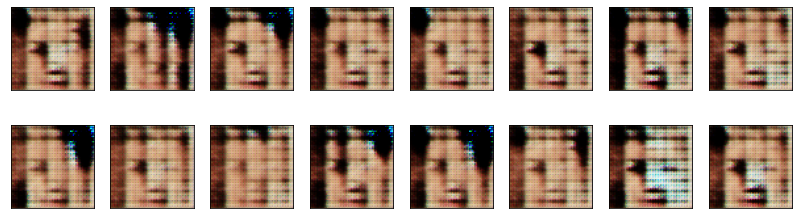

2023-08-10 04:29:39 | Epoch [2/10] | Batch 0/509 | d_loss: 0.1633 | g_loss: 7.2504
2023-08-10 04:29:43 | Epoch [2/10] | Batch 50/509 | d_loss: 5.8750 | g_loss: 3.0740
2023-08-10 04:29:47 | Epoch [2/10] | Batch 100/509 | d_loss: 2.1057 | g_loss: 0.5197
2023-08-10 04:29:51 | Epoch [2/10] | Batch 150/509 | d_loss: 0.2733 | g_loss: 0.0581
2023-08-10 04:29:55 | Epoch [2/10] | Batch 200/509 | d_loss: 1.0438 | g_loss: 0.1829
2023-08-10 04:29:59 | Epoch [2/10] | Batch 250/509 | d_loss: 2.0609 | g_loss: 5.1150
2023-08-10 04:30:03 | Epoch [2/10] | Batch 300/509 | d_loss: 0.9929 | g_loss: 2.8769
2023-08-10 04:30:07 | Epoch [2/10] | Batch 350/509 | d_loss: 1.1840 | g_loss: 1.4435
2023-08-10 04:30:12 | Epoch [2/10] | Batch 400/509 | d_loss: 1.8668 | g_loss: 4.4173
2023-08-10 04:30:17 | Epoch [2/10] | Batch 450/509 | d_loss: 1.4888 | g_loss: 0.6796
2023-08-10 04:30:21 | Epoch [2/10] | Batch 500/509 | d_loss: 2.3583 | g_loss: 1.6404


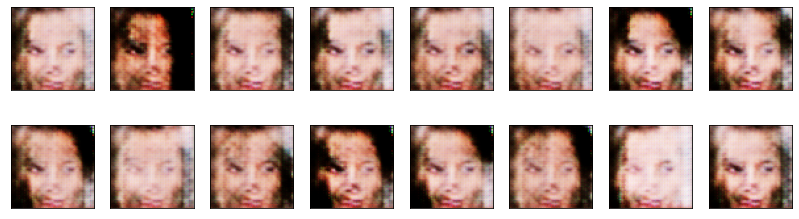

2023-08-10 04:30:26 | Epoch [3/10] | Batch 0/509 | d_loss: 2.1772 | g_loss: 2.0590
2023-08-10 04:30:30 | Epoch [3/10] | Batch 50/509 | d_loss: 2.0838 | g_loss: 0.1135
2023-08-10 04:30:34 | Epoch [3/10] | Batch 100/509 | d_loss: 1.1508 | g_loss: 3.1234
2023-08-10 04:30:39 | Epoch [3/10] | Batch 150/509 | d_loss: 2.2874 | g_loss: 3.2000
2023-08-10 04:30:43 | Epoch [3/10] | Batch 200/509 | d_loss: 2.2406 | g_loss: 2.7679
2023-08-10 04:30:47 | Epoch [3/10] | Batch 250/509 | d_loss: 1.9055 | g_loss: 2.3737
2023-08-10 04:30:51 | Epoch [3/10] | Batch 300/509 | d_loss: 2.5439 | g_loss: 5.4705
2023-08-10 04:30:55 | Epoch [3/10] | Batch 350/509 | d_loss: 1.0723 | g_loss: 1.0112
2023-08-10 04:31:00 | Epoch [3/10] | Batch 400/509 | d_loss: 3.4599 | g_loss: 3.6768
2023-08-10 04:31:04 | Epoch [3/10] | Batch 450/509 | d_loss: 1.2176 | g_loss: 0.2785
2023-08-10 04:31:08 | Epoch [3/10] | Batch 500/509 | d_loss: 2.7814 | g_loss: 2.1320


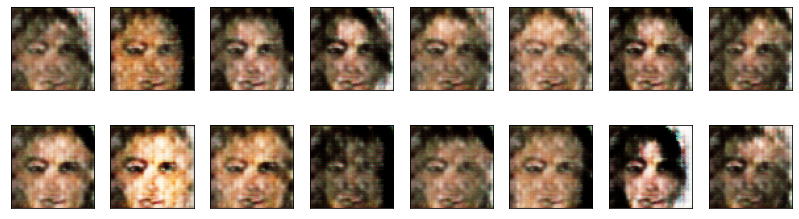

2023-08-10 04:31:12 | Epoch [4/10] | Batch 0/509 | d_loss: 1.0487 | g_loss: 2.0770
2023-08-10 04:31:17 | Epoch [4/10] | Batch 50/509 | d_loss: 2.3818 | g_loss: 1.6389
2023-08-10 04:31:21 | Epoch [4/10] | Batch 100/509 | d_loss: 1.4264 | g_loss: 1.9713
2023-08-10 04:31:25 | Epoch [4/10] | Batch 150/509 | d_loss: 1.5280 | g_loss: 1.8124
2023-08-10 04:31:29 | Epoch [4/10] | Batch 200/509 | d_loss: 0.8391 | g_loss: 0.7697
2023-08-10 04:31:33 | Epoch [4/10] | Batch 250/509 | d_loss: 1.5709 | g_loss: 1.9936
2023-08-10 04:31:38 | Epoch [4/10] | Batch 300/509 | d_loss: 1.6770 | g_loss: 1.7973
2023-08-10 04:31:42 | Epoch [4/10] | Batch 350/509 | d_loss: 0.8878 | g_loss: 2.2748
2023-08-10 04:31:46 | Epoch [4/10] | Batch 400/509 | d_loss: 4.0047 | g_loss: 5.6673
2023-08-10 04:31:50 | Epoch [4/10] | Batch 450/509 | d_loss: 1.2811 | g_loss: 1.4130
2023-08-10 04:31:54 | Epoch [4/10] | Batch 500/509 | d_loss: 2.1989 | g_loss: 3.0666


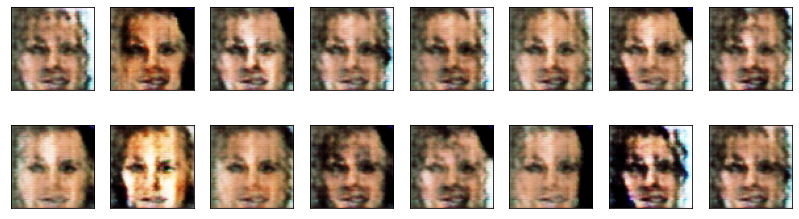

2023-08-10 04:31:59 | Epoch [5/10] | Batch 0/509 | d_loss: 1.4456 | g_loss: 0.9102
2023-08-10 04:32:03 | Epoch [5/10] | Batch 50/509 | d_loss: 1.8073 | g_loss: 2.2943
2023-08-10 04:32:08 | Epoch [5/10] | Batch 100/509 | d_loss: 1.0637 | g_loss: 2.6228
2023-08-10 04:32:12 | Epoch [5/10] | Batch 150/509 | d_loss: 1.8968 | g_loss: 2.4126
2023-08-10 04:32:17 | Epoch [5/10] | Batch 200/509 | d_loss: 0.9406 | g_loss: 3.2398
2023-08-10 04:32:21 | Epoch [5/10] | Batch 250/509 | d_loss: 0.9319 | g_loss: 1.4328
2023-08-10 04:32:25 | Epoch [5/10] | Batch 300/509 | d_loss: 0.9226 | g_loss: 0.9772
2023-08-10 04:32:29 | Epoch [5/10] | Batch 350/509 | d_loss: 1.1697 | g_loss: 1.7586
2023-08-10 04:32:33 | Epoch [5/10] | Batch 400/509 | d_loss: 0.9671 | g_loss: 2.7238
2023-08-10 04:32:38 | Epoch [5/10] | Batch 450/509 | d_loss: 1.7108 | g_loss: 2.4689
2023-08-10 04:32:42 | Epoch [5/10] | Batch 500/509 | d_loss: 1.4174 | g_loss: 1.3724


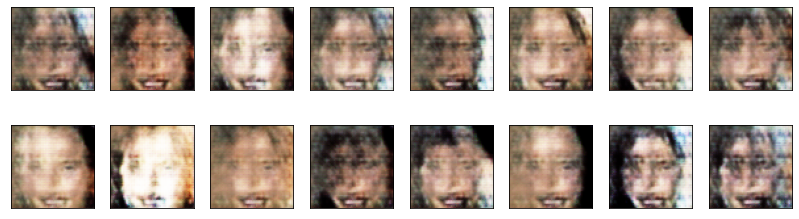

2023-08-10 04:32:46 | Epoch [6/10] | Batch 0/509 | d_loss: 1.4579 | g_loss: 2.2700
2023-08-10 04:32:50 | Epoch [6/10] | Batch 50/509 | d_loss: 0.9555 | g_loss: 0.1449
2023-08-10 04:32:54 | Epoch [6/10] | Batch 100/509 | d_loss: 0.8409 | g_loss: 2.1482
2023-08-10 04:32:59 | Epoch [6/10] | Batch 150/509 | d_loss: 0.6646 | g_loss: 2.8182
2023-08-10 04:33:03 | Epoch [6/10] | Batch 200/509 | d_loss: 1.1004 | g_loss: 2.5069
2023-08-10 04:33:07 | Epoch [6/10] | Batch 250/509 | d_loss: 1.1624 | g_loss: 1.6391
2023-08-10 04:33:11 | Epoch [6/10] | Batch 300/509 | d_loss: 1.1475 | g_loss: 1.5480
2023-08-10 04:33:15 | Epoch [6/10] | Batch 350/509 | d_loss: 0.7522 | g_loss: 3.5326
2023-08-10 04:33:19 | Epoch [6/10] | Batch 400/509 | d_loss: 0.8835 | g_loss: 1.2518
2023-08-10 04:33:24 | Epoch [6/10] | Batch 450/509 | d_loss: 1.4899 | g_loss: 1.1960
2023-08-10 04:33:28 | Epoch [6/10] | Batch 500/509 | d_loss: 2.0731 | g_loss: 1.6586


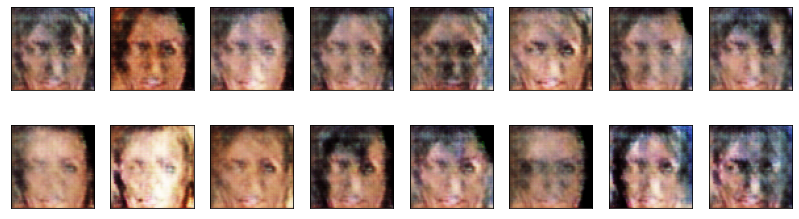

2023-08-10 04:33:32 | Epoch [7/10] | Batch 0/509 | d_loss: 0.4351 | g_loss: 4.0047
2023-08-10 04:33:36 | Epoch [7/10] | Batch 50/509 | d_loss: 2.8684 | g_loss: 2.2371
2023-08-10 04:33:41 | Epoch [7/10] | Batch 100/509 | d_loss: 3.6456 | g_loss: 2.2835
2023-08-10 04:33:45 | Epoch [7/10] | Batch 150/509 | d_loss: 1.2586 | g_loss: 1.8095
2023-08-10 04:33:49 | Epoch [7/10] | Batch 200/509 | d_loss: 2.3488 | g_loss: 1.2181
2023-08-10 04:33:53 | Epoch [7/10] | Batch 250/509 | d_loss: 1.5681 | g_loss: 1.7213
2023-08-10 04:33:57 | Epoch [7/10] | Batch 300/509 | d_loss: 2.2281 | g_loss: 2.4742
2023-08-10 04:34:01 | Epoch [7/10] | Batch 350/509 | d_loss: 1.0548 | g_loss: 2.3039
2023-08-10 04:34:06 | Epoch [7/10] | Batch 400/509 | d_loss: 0.6464 | g_loss: 0.3532
2023-08-10 04:34:10 | Epoch [7/10] | Batch 450/509 | d_loss: 1.6992 | g_loss: 2.1889
2023-08-10 04:34:14 | Epoch [7/10] | Batch 500/509 | d_loss: 1.2530 | g_loss: 2.2064


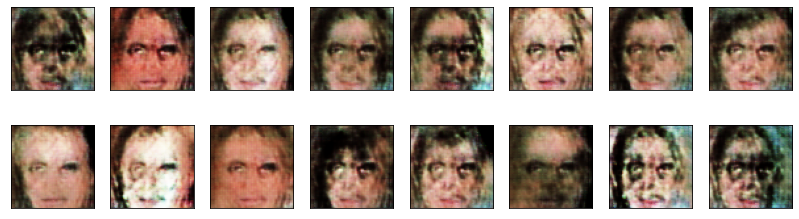

2023-08-10 04:34:20 | Epoch [8/10] | Batch 0/509 | d_loss: 1.4407 | g_loss: 1.5008
2023-08-10 04:34:24 | Epoch [8/10] | Batch 50/509 | d_loss: 1.1476 | g_loss: 2.1713
2023-08-10 04:34:29 | Epoch [8/10] | Batch 100/509 | d_loss: 1.1721 | g_loss: 1.8852
2023-08-10 04:34:33 | Epoch [8/10] | Batch 150/509 | d_loss: 1.7648 | g_loss: 1.6170
2023-08-10 04:34:37 | Epoch [8/10] | Batch 200/509 | d_loss: 2.2542 | g_loss: 2.0980
2023-08-10 04:34:41 | Epoch [8/10] | Batch 250/509 | d_loss: 0.8497 | g_loss: 0.7444
2023-08-10 04:34:45 | Epoch [8/10] | Batch 300/509 | d_loss: 1.8098 | g_loss: 2.6960
2023-08-10 04:34:49 | Epoch [8/10] | Batch 350/509 | d_loss: 1.3739 | g_loss: 2.4481
2023-08-10 04:34:54 | Epoch [8/10] | Batch 400/509 | d_loss: 1.0763 | g_loss: 2.3090
2023-08-10 04:34:58 | Epoch [8/10] | Batch 450/509 | d_loss: 0.5383 | g_loss: 1.3845
2023-08-10 04:35:02 | Epoch [8/10] | Batch 500/509 | d_loss: 0.9987 | g_loss: 3.6531


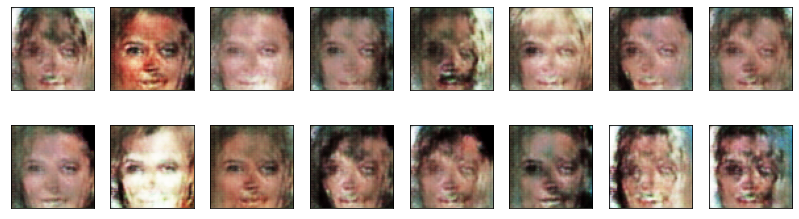

2023-08-10 04:35:06 | Epoch [9/10] | Batch 0/509 | d_loss: 0.9060 | g_loss: 3.0931
2023-08-10 04:35:11 | Epoch [9/10] | Batch 50/509 | d_loss: 1.5594 | g_loss: 3.1950
2023-08-10 04:35:15 | Epoch [9/10] | Batch 100/509 | d_loss: 0.4784 | g_loss: 0.8719
2023-08-10 04:35:19 | Epoch [9/10] | Batch 150/509 | d_loss: 1.4711 | g_loss: 3.4753
2023-08-10 04:35:23 | Epoch [9/10] | Batch 200/509 | d_loss: 1.6552 | g_loss: 5.7275
2023-08-10 04:35:27 | Epoch [9/10] | Batch 250/509 | d_loss: 0.4566 | g_loss: 4.3358
2023-08-10 04:35:31 | Epoch [9/10] | Batch 300/509 | d_loss: 0.8795 | g_loss: 2.8131
2023-08-10 04:35:36 | Epoch [9/10] | Batch 350/509 | d_loss: 1.2363 | g_loss: 2.8020
2023-08-10 04:35:40 | Epoch [9/10] | Batch 400/509 | d_loss: 1.0198 | g_loss: 3.7210
2023-08-10 04:35:44 | Epoch [9/10] | Batch 450/509 | d_loss: 1.5784 | g_loss: 5.2386
2023-08-10 04:35:48 | Epoch [9/10] | Batch 500/509 | d_loss: 0.4606 | g_loss: 0.5863


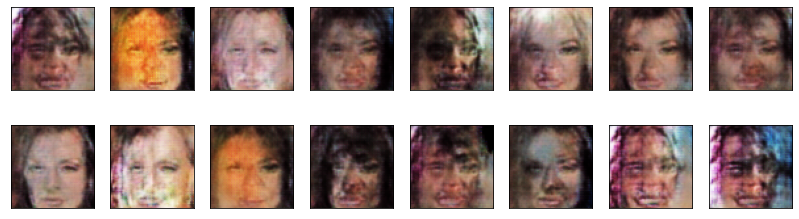

2023-08-10 04:35:52 | Epoch [10/10] | Batch 0/509 | d_loss: 2.2032 | g_loss: 2.6794
2023-08-10 04:35:57 | Epoch [10/10] | Batch 50/509 | d_loss: 1.1369 | g_loss: 4.3361
2023-08-10 04:36:01 | Epoch [10/10] | Batch 100/509 | d_loss: 0.8452 | g_loss: 1.9971
2023-08-10 04:36:05 | Epoch [10/10] | Batch 150/509 | d_loss: 0.2197 | g_loss: 0.1630
2023-08-10 04:36:09 | Epoch [10/10] | Batch 200/509 | d_loss: 0.8870 | g_loss: 2.5063
2023-08-10 04:36:14 | Epoch [10/10] | Batch 250/509 | d_loss: 0.4834 | g_loss: 3.2776
2023-08-10 04:36:18 | Epoch [10/10] | Batch 300/509 | d_loss: 0.8275 | g_loss: 0.6347
2023-08-10 04:36:23 | Epoch [10/10] | Batch 350/509 | d_loss: 1.4313 | g_loss: 3.3664
2023-08-10 04:36:27 | Epoch [10/10] | Batch 400/509 | d_loss: 1.1277 | g_loss: 1.0994
2023-08-10 04:36:31 | Epoch [10/10] | Batch 450/509 | d_loss: 1.1673 | g_loss: 1.9380
2023-08-10 04:36:35 | Epoch [10/10] | Batch 500/509 | d_loss: 0.5011 | g_loss: 3.4044


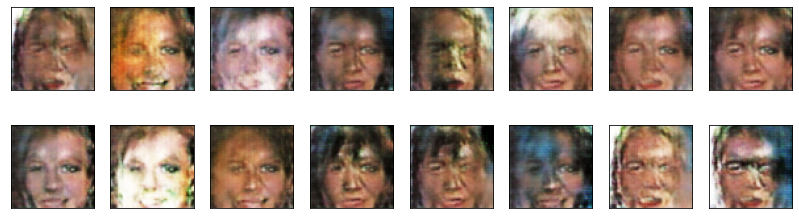

In [24]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        # 1. train discriminator
        if batch_i % 2 == 0: # to train the generator more then the discriminator
            d_loss = discriminator_step(batch_size, latent_dim, real_images)
            
        # 2. train generator
        g_loss = generator_step(batch_size, latent_dim)
    
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

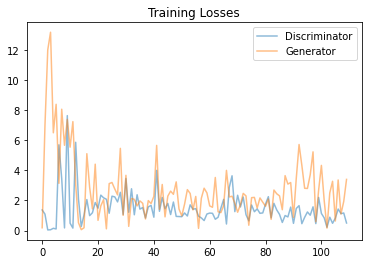

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 
Early epoch training results showed pixelated blocks of facial components, such as eyes, mouth and noses with little variation to each of those components.  As epochs increased, those individual features were more varied and better resolved where by the end of epoch ten the relative positions and outline of a basic face seemed to be learned by the model though distortion still exists suggesting a need for training optimization and potentially larger model architectures.

In addition, most faces were indeed white which inherently limits the variety of skin color and facial features that the GAN can ultimately produce.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.